<img align="left" src="https://www.usn.no/getfile.php/13520508-1525427586/usn.no/om_USN/Logo%20og%20grafiske%20elementer/USN_logo_En_rgb.png" width="250" height="300" href="usn.no">
<h3 align="right">IIA1420 Machine Learning and Sensor Technology</h3>
<br>
<br>
<hr>
 

<!--<h4 align="center">Assignment 2:</h4> -->

<h1 align="center">Assignment 2 - Data Visualization and Regression Models</h1>
<h3 align="center">NASA Turbofan Jet Engine Dataset</h3>

<h1  align="center"><font color="red">(SAMPLE SOLUTION)</font></h1>


<h1  align="left"><font color="blue">Loading the necessary packages</font></h1>


In [1]:
# linear algebra and dataset
import numpy as np 
import pandas as pd 

#plots
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt

#data preprocessing
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.preprocessing import PolynomialFeatures

#data visualization
import seaborn as sns

#accuracy metrics
from sklearn.metrics import r2_score,max_error,mean_squared_error

#regression
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import SGDRegressor

<h1  align="left"><font color="blue">Import data from files</font></h1>


In [2]:
train=pd.read_csv("train_FD001.csv")
test=pd.read_csv("test_FD001.csv")

<h1  align="left"><font color="blue">Understanding the data, data visualization and preprocessing</font></h1>


In [3]:
#Q: What are the variables? 
#Q: How much null items are there in the dataset?
#Q: What is the type of each varibable?
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20631 entries, 0 to 20630
Data columns (total 27 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   engine     20631 non-null  int64  
 1   cycle      20631 non-null  int64  
 2   setting 1  20631 non-null  float64
 3   setting 2  20631 non-null  float64
 4   setting 3  20631 non-null  float64
 5   sensor 1   20631 non-null  float64
 6   sensor 2   20631 non-null  float64
 7   sensor 3   20631 non-null  float64
 8   sensor 4   20631 non-null  float64
 9   sensor 5   20631 non-null  float64
 10  sensor 6   20631 non-null  float64
 11  sensor 7   20631 non-null  float64
 12  sensor 8   20631 non-null  float64
 13  sensor 9   20631 non-null  float64
 14  sensor 10  20631 non-null  float64
 15  sensor 11  20631 non-null  float64
 16  sensor 12  20631 non-null  float64
 17  sensor 13  20631 non-null  float64
 18  sensor 14  20631 non-null  float64
 19  sensor 15  20631 non-null  float64
 20  sensor

In [4]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13096 entries, 0 to 13095
Data columns (total 27 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   engine     13096 non-null  int64  
 1   cycle      13096 non-null  int64  
 2   setting 1  13096 non-null  float64
 3   setting 2  13096 non-null  float64
 4   setting 3  13096 non-null  float64
 5   sensor 1   13096 non-null  float64
 6   sensor 2   13096 non-null  float64
 7   sensor 3   13096 non-null  float64
 8   sensor 4   13096 non-null  float64
 9   sensor 5   13096 non-null  float64
 10  sensor 6   13096 non-null  float64
 11  sensor 7   13096 non-null  float64
 12  sensor 8   13096 non-null  float64
 13  sensor 9   13096 non-null  float64
 14  sensor 10  13096 non-null  float64
 15  sensor 11  13096 non-null  float64
 16  sensor 12  13096 non-null  float64
 17  sensor 13  13096 non-null  float64
 18  sensor 14  13096 non-null  float64
 19  sensor 15  13096 non-null  float64
 20  sensor

In [5]:
#Q: How does the dataset look like?
train.head()

,engine,cycle,setting 1,setting 2,setting 3,sensor 1,sensor 2,sensor 3,sensor 4,sensor 5,...,sensor 13,sensor 14,sensor 15,sensor 16,sensor 17,sensor 18,sensor 19,sensor 20,sensor 21,RUL
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190,191.0
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236,190.0
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442,189.0
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739,188.0
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044,187.0


In [6]:
#Q: How many unique engines are there in the dataset? 
print('Unique engines: ',train.engine.unique())

Unique engines:  [  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100]


In [7]:
#Q: Where the data of each engine begines in test and train sets?

engine_data_start_indices_train = [train.groupby(['engine']).groups[e].min() for e in train.groupby(['engine']).groups]
engine_data_start_indices_test = [test.groupby(['engine']).groups[e].min() for e in test.groupby(['engine']).groups]

print('Each engine data in the train set start at one of the following indices: \n\n', engine_data_start_indices_train)
print('Each engine data in the test set start at one of the following indices: \n\n', engine_data_start_indices_test)

Each engine data in the train set start at one of the following indices: 

 [0, 192, 479, 658, 847, 1116, 1304, 1563, 1713, 1914, 2136, 2376, 2546, 2709, 2889, 3096, 3305, 3581, 3776, 3934, 4168, 4363, 4565, 4733, 4880, 5110, 5309, 5465, 5630, 5793, 5987, 6221, 6412, 6612, 6807, 6988, 7146, 7316, 7510, 7638, 7826, 8042, 8238, 8445, 8637, 8795, 9051, 9265, 9496, 9711, 9909, 10122, 10335, 10530, 10787, 10980, 11255, 11392, 11539, 11770, 11942, 12127, 12307, 12481, 12764, 12917, 13119, 13432, 13631, 13993, 14130, 14338, 14551, 14764, 14930, 15159, 15369, 15523, 15754, 15953, 16138, 16378, 16592, 16885, 17152, 17340, 17618, 17796, 18009, 18226, 18380, 18515, 18856, 19011, 19269, 19552, 19888, 20090, 20246, 20431]
Each engine data in the test set start at one of the following indices: 

 [0, 31, 80, 206, 312, 410, 515, 675, 841, 896, 1088, 1171, 1388, 1583, 1629, 1705, 1818, 1983, 2116, 2251, 2435, 2583, 2622, 2752, 2938, 2986, 3062, 3202, 3360, 3531, 3674, 3870, 4015, 4065, 4268, 4466, 459

In [8]:
#Q: What are the maximum, minimum, mean, standard deviation, etc values for each column? (data statistics)
train[train.columns[:10]].describe()

,engine,cycle,setting 1,setting 2,setting 3,sensor 1,sensor 2,sensor 3,sensor 4,sensor 5
count,20631.000000,20631.000000,20631.000000,20631.000000,20631.0,2.063100e+04,20631.000000,20631.000000,20631.000000,2.063100e+04
mean,51.506568,108.807862,-0.000009,0.000002,100.0,5.186700e+02,642.680934,1590.523119,1408.933782,1.462000e+01
std,29.227633,68.880990,0.002187,0.000293,0.0,6.537152e-11,0.500053,6.131150,9.000605,3.394700e-12
min,1.000000,1.000000,-0.008700,-0.000600,100.0,5.186700e+02,641.210000,1571.040000,1382.250000,1.462000e+01
25%,26.000000,52.000000,-0.001500,-0.000200,100.0,5.186700e+02,642.325000,1586.260000,1402.360000,1.462000e+01
50%,52.000000,104.000000,0.000000,0.000000,100.0,5.186700e+02,642.640000,1590.100000,1408.040000,1.462000e+01
75%,77.000000,156.000000,0.001500,0.000300,100.0,5.186700e+02,643.000000,1594.380000,1414.555000,1.462000e+01
max,100.000000,362.000000,0.008700,0.000600,100.0,5.186700e+02,644.530000,1616.910000,1441.490000,1.462000e+01


In [9]:
train[train.columns[10:20]].describe()

,sensor 6,sensor 7,sensor 8,sensor 9,sensor 10,sensor 11,sensor 12,sensor 13,sensor 14,sensor 15
count,20631.000000,20631.000000,20631.000000,20631.000000,2.063100e+04,20631.000000,20631.000000,20631.000000,20631.000000,20631.000000
mean,21.609803,553.367711,2388.096652,9065.242941,1.300000e+00,47.541168,521.413470,2388.096152,8143.752722,8.442146
std,0.001389,0.885092,0.070985,22.082880,4.660829e-13,0.267087,0.737553,0.071919,19.076176,0.037505
min,21.600000,549.850000,2387.900000,9021.730000,1.300000e+00,46.850000,518.690000,2387.880000,8099.940000,8.324900
25%,21.610000,552.810000,2388.050000,9053.100000,1.300000e+00,47.350000,520.960000,2388.040000,8133.245000,8.414900
50%,21.610000,553.440000,2388.090000,9060.660000,1.300000e+00,47.510000,521.480000,2388.090000,8140.540000,8.438900
75%,21.610000,554.010000,2388.140000,9069.420000,1.300000e+00,47.700000,521.950000,2388.140000,8148.310000,8.465600
max,21.610000,556.060000,2388.560000,9244.590000,1.300000e+00,48.530000,523.380000,2388.560000,8293.720000,8.584800


In [10]:
train[train.columns[20:]].describe()

,sensor 16,sensor 17,sensor 18,sensor 19,sensor 20,sensor 21,RUL
count,2.063100e+04,20631.000000,20631.0,20631.0,20631.000000,20631.000000,20631.000000
mean,3.000000e-02,393.210654,2388.0,100.0,38.816271,23.289705,107.807862
std,1.556432e-14,1.548763,0.0,0.0,0.180746,0.108251,68.880990
min,3.000000e-02,388.000000,2388.0,100.0,38.140000,22.894200,0.000000
25%,3.000000e-02,392.000000,2388.0,100.0,38.700000,23.221800,51.000000
50%,3.000000e-02,393.000000,2388.0,100.0,38.830000,23.297900,103.000000
75%,3.000000e-02,394.000000,2388.0,100.0,38.950000,23.366800,155.000000
max,3.000000e-02,400.000000,2388.0,100.0,39.430000,23.618400,361.000000


In [11]:
test.describe()

,engine,cycle,setting 1,setting 2,setting 3,sensor 1,sensor 2,sensor 3,sensor 4,sensor 5,...,sensor 13,sensor 14,sensor 15,sensor 16,sensor 17,sensor 18,sensor 19,sensor 20,sensor 21,RUL
count,13096.000000,13096.000000,13096.000000,13096.000000,13096.0,1.309600e+04,13096.000000,13096.000000,13096.000000,1.309600e+04,...,13096.000000,13096.000000,13096.000000,1.309600e+04,13096.000000,13096.0,13096.0,13096.000000,13096.000000,13096.000000
mean,51.543907,76.836515,-0.000011,0.000004,100.0,5.186700e+02,642.475088,1588.099204,1404.735362,1.462000e+01,...,2388.071025,8138.947817,8.425844,3.000000e-02,392.571625,2388.0,100.0,38.892502,23.335743,141.238470
std,28.289423,53.057749,0.002203,0.000294,0.0,6.014263e-11,0.400899,5.003274,6.688309,2.671743e-12,...,0.056934,10.188605,0.029009,8.823140e-15,1.233577,0.0,0.0,0.141681,0.084120,58.980114
min,1.000000,1.000000,-0.008200,-0.000600,100.0,5.186700e+02,641.130000,1569.040000,1384.390000,1.462000e+01,...,2387.890000,8108.500000,8.332800,3.000000e-02,389.000000,2388.0,100.0,38.310000,22.935400,7.000000
25%,28.000000,33.000000,-0.001500,-0.000200,100.0,5.186700e+02,642.197500,1584.600000,1399.950000,1.462000e+01,...,2388.030000,8132.310000,8.405600,3.000000e-02,392.000000,2388.0,100.0,38.800000,23.281600,102.000000
50%,52.000000,69.000000,0.000000,0.000000,100.0,5.186700e+02,642.460000,1587.990000,1404.440000,1.462000e+01,...,2388.070000,8138.390000,8.424900,3.000000e-02,393.000000,2388.0,100.0,38.900000,23.339200,140.000000
75%,76.000000,113.000000,0.001500,0.000300,100.0,5.186700e+02,642.740000,1591.362500,1409.050000,1.462000e+01,...,2388.110000,8144.360000,8.444300,3.000000e-02,393.000000,2388.0,100.0,38.990000,23.393600,179.000000
max,100.000000,303.000000,0.007800,0.000700,100.0,5.186700e+02,644.300000,1607.550000,1433.360000,1.462000e+01,...,2388.320000,8220.480000,8.541400,3.000000e-02,397.000000,2388.0,100.0,39.410000,23.641900,340.000000


<font color="blue">
<h3 align="left">Discussion:</h3>
<p style="text-align:justify">First of all, we need to define the inputs and outputs of the model. The objective is to predict the RUL. So, the RUL column (last column) is the output of the model (i.e., target variable). What about the engine number (i.e., first column)? Is it a feature for the model? The answer is no! We do not care about the engine number in our model, because the engines are similar and the model should be universal for all engines of this type. So, engine number is neigher a feature nor the target in the model. However, we can keep it in the dataset as we need it for data processing. </p>
<p />   
<p style="text-align:justify">The second column is already used to make the RUL values. So, it is useless in the modeling. The rest of columns (i.e., setting 1 ~ 3 and sensor 1 ~ 21) are the inputs to the model (i.e., features). Do we need all of them? Based on information produced by "describe" command, we know:</p>   
<p />   
<ul>
  <li>Setting 3 has a constant value of 100. So, there is no information in that feature.</li>
  <li>Sensors 1, 5, 10, 16, 18, and 19 also contain constant values and we can safely remove them from the dataset.</li>
  <li>Sensors 6 values are eigther 21.60 or 21.61 which do not seem related to the RUL values. So, it also can be removed from the dataset. </li>
  <li>The standard deviations of almost all the sensors are much less than the mean value. Therefore, perfoming a scaling method on the data is a good idea before the next steps.</li>
</ul>
<p />   
<p style="text-align:justify">So, let us separate X and y columns based on above discussion and scale the features.</p>
<p /> 
<h3 align="left">Removing useless columns from dataset:</h3>

</font>

In [12]:
all_columns = train.columns
useless_columns = ['cycle', 'setting 3', 'sensor 1', 'sensor 5', 'sensor 6', 'sensor 10', 'sensor 16', 'sensor 18', 'sensor 19']
X_columns = all_columns.drop(useless_columns + ['engine','RUL'])



train_cleaned = train.drop(columns=useless_columns)
test_cleaned = test.drop(columns=useless_columns)

train_cleaned.head()

,engine,setting 1,setting 2,sensor 2,sensor 3,sensor 4,sensor 7,sensor 8,sensor 9,sensor 11,sensor 12,sensor 13,sensor 14,sensor 15,sensor 17,sensor 20,sensor 21,RUL
0,1,-0.0007,-0.0004,641.82,1589.70,1400.60,554.36,2388.06,9046.19,47.47,521.66,2388.02,8138.62,8.4195,392,39.06,23.4190,191.0
1,1,0.0019,-0.0003,642.15,1591.82,1403.14,553.75,2388.04,9044.07,47.49,522.28,2388.07,8131.49,8.4318,392,39.00,23.4236,190.0
2,1,-0.0043,0.0003,642.35,1587.99,1404.20,554.26,2388.08,9052.94,47.27,522.42,2388.03,8133.23,8.4178,390,38.95,23.3442,189.0
3,1,0.0007,0.0000,642.35,1582.79,1401.87,554.45,2388.11,9049.48,47.13,522.86,2388.08,8133.83,8.3682,392,38.88,23.3739,188.0
4,1,-0.0019,-0.0002,642.37,1582.85,1406.22,554.00,2388.06,9055.15,47.28,522.19,2388.04,8133.80,8.4294,393,38.90,23.4044,187.0


<font color="blue">
<h3 align="left">Data scaling:</h3>
<p style="text-align:justify">To scale the data, MinMaxScaler or StandardScaler can be used. However, it is important to scale both train and test sets based on min/max or mean/std values of the train set (read <a href="https://datascience.stackexchange.com/questions/39932/feature-scaling-both-training-and-test-data">this</a>). So, for the train set "fit_transform" command is used and for the test set, "transform" command is used. <p \>NOTE that, by using StandardScaler, the scaled train set has zero mean and unit variance. However, the scaled test data does not have these properties as it is scaled based on train set.</p>
</font>

In [13]:
#scaler = MinMaxScaler()
scaler = StandardScaler()

train_scaled = train_cleaned.copy()
test_scaled = test_cleaned.copy()

train_scaled[X_columns] = scaler.fit_transform(train_cleaned[X_columns])   # fit_transform
test_scaled[X_columns] = scaler.transform(test_cleaned[X_columns])        # transform

train_scaled

,engine,setting 1,setting 2,sensor 2,sensor 3,sensor 4,sensor 7,sensor 8,sensor 9,sensor 11,sensor 12,sensor 13,sensor 14,sensor 15,sensor 17,sensor 20,sensor 21,RUL
0,1,-0.315980,-1.372953,-1.721725,-0.134255,-0.925936,1.121141,-0.516338,-0.862813,-0.266467,0.334262,-1.058890,-0.269071,-0.603816,-0.781710,1.348493,1.194427,191.0
1,1,0.872722,-1.031720,-1.061780,0.211528,-0.643726,0.431930,-0.798093,-0.958818,-0.191583,1.174899,-0.363646,-0.642845,-0.275852,-0.781710,1.016528,1.236922,190.0
2,1,-1.961874,1.015677,-0.661813,-0.413166,-0.525953,1.008155,-0.234584,-0.557139,-1.015303,1.364721,-0.919841,-0.551629,-0.649144,-2.073094,0.739891,0.503423,189.0
3,1,0.324090,-0.008022,-0.661813,-1.261314,-0.784831,1.222827,0.188048,-0.713826,-1.539489,1.961302,-0.224597,-0.520176,-1.971665,-0.781710,0.352598,0.777792,188.0
4,1,-0.864611,-0.690488,-0.621816,-1.251528,-0.301518,0.714393,-0.516338,-0.457059,-0.977861,1.052871,-0.780793,-0.521748,-0.339845,-0.136018,0.463253,1.059552,187.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20626,100,-0.178822,-1.031720,1.618000,1.216258,2.188375,-2.189329,1.315066,0.012547,1.980044,-2.607969,2.278282,-0.322542,1.425294,2.446751,-1.805173,-2.921113,4.0
20627,100,-0.727453,-1.714186,1.717992,2.279706,2.738351,-2.833345,1.878576,-0.006020,1.867718,-2.350355,1.722087,-0.380207,1.913240,1.155367,-2.856395,-1.203764,3.0
20628,100,0.186933,-0.008022,1.478011,1.946971,2.138377,-2.742957,2.019453,0.029755,2.054927,-1.902919,2.000184,-0.141684,3.265092,3.092444,-2.081810,-3.292481,2.0
20629,100,-0.498857,1.015677,1.098043,2.403666,1.955051,-3.036719,2.160330,0.383884,3.178182,-2.363913,1.861136,-0.233948,2.579834,1.155367,-2.911722,-2.085072,1.0


In [14]:
train_scaled[X_columns].describe()

,setting 1,setting 2,sensor 2,sensor 3,sensor 4,sensor 7,sensor 8,sensor 9,sensor 11,sensor 12,sensor 13,sensor 14,sensor 15,sensor 17,sensor 20,sensor 21
count,2.063100e+04,2.063100e+04,2.063100e+04,2.063100e+04,2.063100e+04,2.063100e+04,2.063100e+04,2.063100e+04,2.063100e+04,2.063100e+04,2.063100e+04,2.063100e+04,2.063100e+04,2.063100e+04,2.063100e+04,2.063100e+04
mean,-9.880129e-18,6.097267e-16,6.258537e-14,-4.962530e-14,8.308134e-16,-3.149990e-14,1.008424e-12,-4.172343e-14,-2.547136e-15,-1.199984e-13,3.503748e-13,2.704422e-15,-3.236684e-14,1.863604e-14,4.174604e-14,2.419665e-14
std,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00,1.000024e+00
min,-3.973523e+00,-2.055419e+00,-2.941625e+00,-3.177804e+00,-2.964737e+00,-3.974497e+00,-2.770375e+00,-1.970486e+00,-2.587860e+00,-3.692663e+00,-3.005574e+00,-2.296780e+00,-3.126205e+00,-3.364479e+00,-3.741634e+00,-3.653688e+00
25%,-6.817340e-01,-6.904875e-01,-7.118085e-01,-6.953381e-01,-7.303888e-01,-6.301317e-01,-6.572157e-01,-5.498936e-01,-7.157686e-01,-6.148450e-01,-7.807925e-01,-5.508429e-01,-7.264689e-01,-7.817098e-01,-6.432961e-01,-6.273114e-01
50%,4.055368e-03,-8.021809e-03,-8.186036e-02,-6.901297e-02,-9.930481e-02,8.167571e-02,-9.370652e-02,-2.075387e-01,-1.166993e-01,9.020580e-02,-8.554830e-02,-1.684195e-01,-8.653932e-02,-1.360176e-01,7.596096e-02,7.570228e-02
75%,6.898448e-01,1.015677e+00,6.380804e-01,6.290786e-01,6.245530e-01,7.256920e-01,6.106800e-01,1.891583e-01,5.946956e-01,7.274632e-01,6.096959e-01,2.389047e-01,6.253823e-01,5.096747e-01,7.398906e-01,7.122022e-01
max,3.981634e+00,2.039375e+00,3.697829e+00,4.303846e+00,3.617202e+00,3.041891e+00,6.527526e+00,8.121740e+00,3.702368e+00,2.666353e+00,6.449748e+00,7.861686e+00,3.803699e+00,4.383828e+00,3.395609e+00,3.036489e+00


In [15]:
test_scaled[X_columns].describe()

,setting 1,setting 2,sensor 2,sensor 3,sensor 4,sensor 7,sensor 8,sensor 9,sensor 11,sensor 12,sensor 13,sensor 14,sensor 15,sensor 17,sensor 20,sensor 21
count,13096.000000,13096.000000,13096.000000,13096.000000,13096.000000,13096.000000,13096.000000,13096.000000,13096.000000,13096.000000,13096.000000,13096.000000,13096.000000,13096.000000,13096.000000,13096.000000
mean,-0.001056,0.006439,-0.411658,-0.395354,-0.466471,0.440430,-0.361875,-0.309549,-0.467888,0.453204,-0.349397,-0.251886,-0.434662,-0.412616,0.421766,0.425294
std,1.007052,1.003329,0.801733,0.816062,0.743114,0.769753,0.809224,0.517892,0.733550,0.758779,0.791665,0.534114,0.773497,0.796511,0.783884,0.777105
min,-3.744927,-2.055419,-3.101612,-3.504015,-2.726970,-2.810748,-2.911252,-1.843687,-2.775070,-2.757115,-2.866525,-1.848042,-2.915561,-2.718786,-2.801067,-3.273082
25%,-0.681734,-0.690488,-0.966788,-0.966093,-0.998155,-0.065205,-0.938970,-0.644087,-1.015303,-0.045381,-0.919841,-0.599858,-0.974442,-0.781710,-0.090021,-0.074878
50%,0.004055,-0.008022,-0.441831,-0.413166,-0.499288,0.488423,-0.375461,-0.358791,-0.491118,0.496966,-0.363646,-0.281128,-0.459832,-0.136018,0.463253,0.457233
75%,0.689845,1.015677,0.118123,0.136908,0.012913,0.985558,0.188048,-0.051305,-0.004374,0.998637,0.192549,0.031835,0.057445,-0.136018,0.961200,0.959781
max,3.570160,2.380608,3.237866,2.777178,2.713908,2.793323,2.864717,4.066011,2.691438,3.181582,3.112575,4.022249,2.646493,2.446751,3.284954,3.253583


<font color="blue">
<h1 align="left">STEP 3: Data visualization</h1>
<p style="text-align:justify">While the dataset is a time series, the best visulization method is to plot the time plot of data. Here, "plotly.express" is used to generate interactive plots. Engines #1 (first engine), #39 (minimum starting RUL), and #69 (maximum starting RUL) are plotted and they are sufficient for getting some idea about the trends in the data. </p>
</font>



In [16]:
fig = px.line(train_scaled[train_scaled['engine']==1], x='RUL',y=X_columns)
fig.update_layout(xaxis = dict(autorange="reversed"))

In [17]:
fig = px.line(train_scaled[train_scaled['engine']==39], x='RUL',y=X_columns)
fig.update_layout(xaxis = dict(autorange="reversed"))

In [18]:
fig = px.line(train_scaled[train_scaled['engine']==69], x='RUL',y=X_columns)
fig.update_layout(xaxis = dict(autorange="reversed"))

<font color="blue">
<h3 align="left">Correlations</h3>
<p style="text-align:justify">Covariance and correlation (similar concepts) are very useful tools for feature selection. Let us first plot the correlations matrix using heatmap.</p>
</font>


<AxesSubplot:>

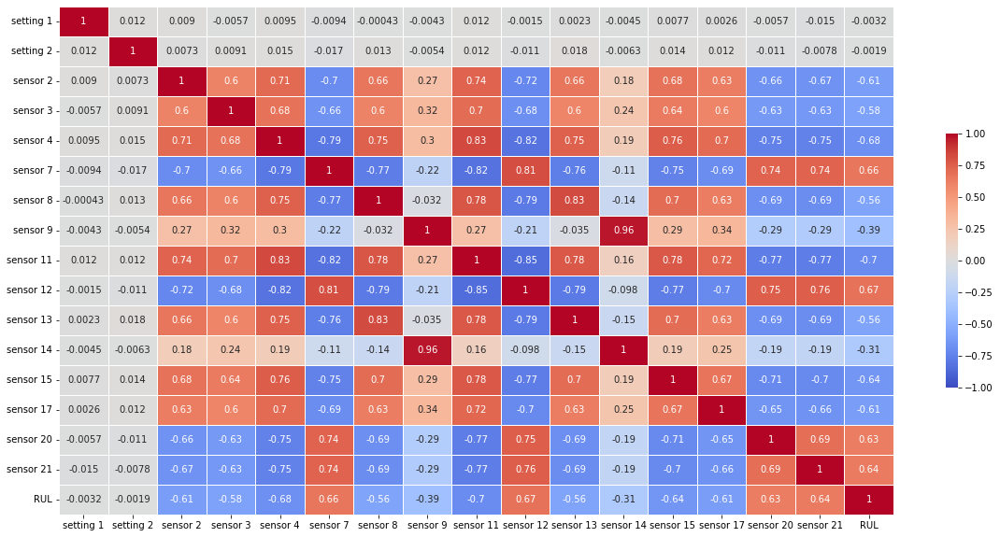

In [19]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(20,10)) 
#sns.heatmap(,annot=True,cmap= 'coolwarm',font=dict(size=8))
sns.heatmap(
    train_scaled[train_scaled.columns[1:]].corr(),          
    cmap='coolwarm',    
    annot=True,
    annot_kws={"fontsize":10},
    vmax= 1.0,      
    vmin=-1.0,    
    center=0,     
    linewidths=.5, 
    cbar_kws={"shrink": .5}  
)

<font color="blue">
<h3 align="left">Discussion:</h3>
<p style="text-align:justify">There are two usage for above heatmap:</p>

<ul>
  <li>The correlation between features. If two features are highly correlated, one can be removed from dataset because these two features almost contain the same information. For example, a threshold of |corr| > 0.95 is a good choice for removing features. In this dataset, the correlation between sensors 9 and 14 is 0.96 and one seems enough for modeling.</li>
  <li>The correlation between each feature and the target. If the correlation of a feature and target is almost zero, then this feature problably (!) cannot contribute to the model. For example, setting 1 and 2 has a very low correlation with the RUL values. We can decide to remove them from the dataset or keep them. Let us, keep them for now. However, another helpful thing here is the selection between sensors 9 and 14. As sensor 9 has a higher absolute correlation with RUL (i.e., -0.39) than sensor 14 (i.e., -0.31), we may keep sensor 9 and remove sensor 14 from the dataset: </li>
</ul>

</font>

In [20]:
train_scaled_1 = train_scaled.drop(columns=['sensor 14'])
test_scaled_1 = test_scaled.drop(columns=['sensor 14'])
X_columns_1 = X_columns.drop(['sensor 14'])

<font color="blue">
<h3 align="left">How to plot the target?</h3>
<p style="text-align:justify">It is always interesting to illustrates the traget variable in a way that anyone can see the performance of the model with a short look. This also very important when we are going to publish papers.</p>
    
<p /> 
    
    
<p style="text-align:justify">In this dataset, there are 100 engine, each start from an RUL value and this value decreases linearly in time (1 per cycle). If we plot all RUL vales in one plot, the plot will become nasty and usable. However, by using interactive plots, we are able to zoom in and look at the details. It is also possible to plot the RUL for each engine and present a few of these plots in the report. Here the interactive plot of all RULs is selected for illustration:</p>

</font>

In [21]:
fig = px.line(train_scaled,y='RUL',color='engine',markers=True)
fig.show()

<font color="blue">
<h1 align="left">Regression Models</h1>
    
<h3 align="left">X and y - train and test</h3>

</font>

In [22]:
X_train = train_scaled_1.drop(columns = ['engine', 'RUL'])
X_test = test_scaled_1.drop(columns = ['engine', 'RUL'])

y_train = train_scaled_1['RUL']
y_test = test_scaled_1['RUL']

<font color="blue">
    
<h3 align="left">A function for making the model and generating the plots</h3>

</font>

In [23]:
def make_and_test_model(X_tr, y_tr, X_te, y_te, regression_type, regression_parameters):
    reg = regression_type(**regression_parameters).fit(X_tr, y_tr)
    y_tr_pre = reg.predict(X_tr)
    y_te_pre = reg.predict(X_te)
    
    print('--------------------TRAIN SET-------------------------')
    print('r2_score = ','%.2f' % r2_score(y_tr,y_tr_pre), '(1.0 means perfect fit)')
    print('max_error = ','%.2f' % max_error(y_tr,y_tr_pre))
    print('mean_squared_error = ','%.2f' % mean_squared_error(y_tr,y_tr_pre))
    print('--------------------TEST SET-------------------------')
    print('r2_score = ','%.2f' % r2_score(y_te,y_te_pre), '(1.0 means perfect fit)')
    print('max_error = ','%.2f' % max_error(y_te,y_te_pre))
    print('mean_squared_error = ','%.2f' % mean_squared_error(y_te,y_te_pre))
    print(y_tr.index[:100])
    
    
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=y_tr.index, y=y_tr, name="True", mode="markers", marker=dict(size=2)))
    fig.add_trace(go.Scatter(x=y_tr.index, y=y_tr_pre, name="Predict", mode="markers", marker=dict(size=3)))
    fig.update_layout(
        title="True/Prediction on train set",
        xaxis_title="Data index",
        yaxis_title="RUL"
    )
    fig.show()
    
    
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=y_te.index, y=y_te, name="True", mode="markers", marker=dict(size=2) ))
    fig.add_trace(go.Scatter(x=y_te.index, y=y_te_pre, name="Predict", mode="markers", marker=dict(size=3)))
    fig.update_layout(
        title="True/Prediction on test set",
        xaxis_title="Data index",
        yaxis_title="RUL"
    )
    fig.show()
    
    return r2_score(y_tr,y_tr_pre), r2_score(y_te,y_te_pre)


In [24]:
from tabulate import tabulate

methods_performance_table = [['Regression method','r2-score (train)','r2-score (test)']]



<font color="blue">
    
<h3 align="left">a. Linear regression</h3>

</font>

In [25]:
a,b = make_and_test_model(X_train, y_train, X_test, y_test,LinearRegression,{})
methods_performance_table.append(['Linear regression', "%.2f" % a, "%.2f" % b])

--------------------TRAIN SET-------------------------
r2_score =  0.58 (1.0 means perfect fit)
max_error =  214.89
mean_squared_error =  1996.61
--------------------TEST SET-------------------------
r2_score =  0.33 (1.0 means perfect fit)
max_error =  220.30
mean_squared_error =  2346.26
RangeIndex(start=0, stop=100, step=1)


<font color="blue">
    
<h3 align="left">b. Polynomial regression (n = 3)</h3>

</font>

In [26]:
n = 3
poly = PolynomialFeatures(n)

a,b = make_and_test_model(poly.fit_transform(X_train), y_train, poly.fit_transform(X_test), y_test,LinearRegression,{})
methods_performance_table.append(['Polynomial regression', "%.2f" % a, "%.2f" % b])

--------------------TRAIN SET-------------------------
r2_score =  0.64 (1.0 means perfect fit)
max_error =  216.36
mean_squared_error =  1730.68
--------------------TEST SET-------------------------
r2_score =  0.35 (1.0 means perfect fit)
max_error =  220.44
mean_squared_error =  2263.88
RangeIndex(start=0, stop=100, step=1)


<font color="blue">
    
<h3 align="left">c. Stochastic Gradient Descent</h3>

</font>

In [27]:
par = {'max_iter':2000, 'tol':1e-5, 'penalty':None, 'eta0':0.15}
a,b = make_and_test_model(X_train, y_train, X_test, y_test,SGDRegressor,par)
methods_performance_table.append(['Stochastic Gradient Descent', "%.2f" % a, "%.2f" % b])

--------------------TRAIN SET-------------------------
r2_score =  0.57 (1.0 means perfect fit)
max_error =  216.23
mean_squared_error =  2061.02
--------------------TEST SET-------------------------
r2_score =  0.34 (1.0 means perfect fit)
max_error =  221.15
mean_squared_error =  2301.95
RangeIndex(start=0, stop=100, step=1)


<font color="blue">
    
<h3 align="left">d. Shifted features</h3>
    
<p style="text-align:justify">First, let us make a function to generate a new dataset with adding shifted features. This function can then be used for both train and test sets. In this function, "m" is the number of past values we want the model use them in prediction. In other word, as for each feature x, we are adding x(t-i) to the dataset, m is the maximum value for i. For example, in this sample solution, m = 120 means all the values x(t), x(t-1), ..., x(t-120) are used to predict y(t). Obviously, x represent only one feature. And as we have 15 features, then 15x121 = 1815 features shape our new feature set. </p>

</font>

In [28]:
def make_shifted_feature_dataset(df, m, X_cols, y_cols):
  
    temp_df_shifted = pd.DataFrame(df, columns=y_cols)
    
    shifted_columns_names = [s + ' (t)' for s in X_cols]   
    temp_df_shifted[shifted_columns_names] = pd.DataFrame(df[X_cols])

    for i in range(1,m+1):
        shifted_columns_names = [s + ' (t-{})'.format(i) for s in X_cols]
        temp_df_shifted[shifted_columns_names] = pd.DataFrame(df[X_cols]).shift(periods=i)
    return temp_df_shifted

In [29]:
m = 120
train_shifted_features = make_shifted_feature_dataset(train_scaled_1, m, X_columns_1, ['RUL'])
test_shifted_features = make_shifted_feature_dataset(test_scaled_1, m, X_columns_1, ['RUL'])


train_shifted_features.info()

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:3641: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20631 entries, 0 to 20630
Columns: 1816 entries, RUL to sensor 21 (t-120)
dtypes: float64(1816)
memory usage: 285.8 MB


<font color="blue">
    
<h4 align="left">Pruning the useless rows</h4>
    
<p style="text-align:justify">When we added m shifted features to the dataset, m first rows contain "NaN" values and must be remove from the dataset. However, we must also pay attention to each engine data as well. Because, for example, the first row of data for engine #2, has some shifted data from engine #1 and this means the data in that row cannot be used for prediction of RUL in engine #2 (i.e., they do not belong to engine #2). So, the first m rows of data regarding engine #2 must be removed from the dataset. This is done in the following code blocks:</p>


</font>

In [30]:
#Pruning the rows - train set
rows_must_drop_train = np.empty(0,dtype=int)

for i in engine_data_start_indices_train:
    rows_must_drop_train = np.append(rows_must_drop_train,np.arange(i,i+m))

#new X and y for train
X_train_shifted_features = train_shifted_features.drop(columns='RUL', index = rows_must_drop_train)
y_train_shifted_features = train_shifted_features['RUL'].drop(index = rows_must_drop_train)
    
print('These rows must be deleted from the train set: \n \n',rows_must_drop_train)
pd.concat([y_train_shifted_features,X_train_shifted_features],axis=1)

These rows must be deleted from the train set: 
 
 [    0     1     2 ... 20548 20549 20550]


,RUL,setting 1 (t),setting 2 (t),sensor 2 (t),sensor 3 (t),sensor 4 (t),sensor 7 (t),sensor 8 (t),sensor 9 (t),sensor 11 (t),...,sensor 7 (t-120),sensor 8 (t-120),sensor 9 (t-120),sensor 11 (t-120),sensor 12 (t-120),sensor 13 (t-120),sensor 15 (t-120),sensor 17 (t-120),sensor 20 (t-120),sensor 21 (t-120)
120,71.0,-1.504681,1.356910,-0.101859,0.495332,0.329566,0.375438,-0.375461,-1.099201,-0.378792,...,1.121141,-0.516338,-0.862813,-0.266467,0.334262,-1.058890,-0.603816,-0.781710,1.348493,1.194427
121,70.0,1.192757,-0.349255,1.238031,0.514905,0.559556,0.070377,0.751557,-1.034896,0.220277,...,0.431930,-0.798093,-0.958818,-0.191583,1.174899,-0.363646,-0.275852,-0.781710,1.016528,1.236922
122,69.0,0.735564,-0.690488,1.418016,-0.630096,-0.654836,-0.822207,0.328925,-0.715637,-0.491118,...,1.008155,-0.234584,-0.557139,-1.015303,1.364721,-0.919841,-0.649144,-2.073094,0.739891,0.503423
123,68.0,1.147038,0.674444,-0.401834,-0.551805,-0.739277,-1.251551,0.469803,-0.553064,0.033068,...,1.222827,0.188048,-0.713826,-1.539489,1.961302,-0.224597,-1.971665,-0.781710,0.352598,0.777792
124,67.0,-0.178822,1.698142,0.558087,-0.824191,-0.279297,-1.048177,0.469803,-0.864172,0.332603,...,0.714393,-0.516338,-0.457059,-0.977861,1.052871,-0.780793,-0.339845,-0.136018,0.463253,1.059552
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20626,4.0,-0.178822,-1.031720,1.618000,1.216258,2.188375,-2.189329,1.315066,0.012547,1.980044,...,0.917767,-0.093707,-0.294033,-0.266467,0.374938,-0.363646,-0.139867,-0.781710,-0.532641,0.839687
20627,3.0,-0.727453,-1.714186,1.717992,2.279706,2.738351,-2.833345,1.878576,-0.006020,1.867718,...,-0.765714,-0.516338,-0.152291,0.070510,0.524083,-0.085548,-1.105094,0.509675,0.186616,-0.298438
20628,2.0,0.186933,-0.008022,1.478011,1.946971,2.138377,-2.742957,2.019453,0.029755,2.054927,...,0.612707,-0.375461,-0.365583,-0.678327,0.185116,-0.641744,-0.974442,-0.781710,0.684563,-0.144163
20629,1.0,-0.498857,1.015677,1.098043,2.403666,1.955051,-3.036719,2.160330,0.383884,3.178182,...,0.714393,-0.234584,-0.389132,0.220277,0.903726,-0.641744,0.518727,-0.136018,-0.421986,0.882182


In [31]:
#Pruning the rows - test set
rows_must_drop_test = np.empty(0,dtype=int)

for i in engine_data_start_indices_test:
    rows_must_drop_test = np.append(rows_must_drop_test,np.arange(i,i+m))

#new X and y for test
X_test_shifted_features = test_shifted_features.drop(columns='RUL', index = rows_must_drop_test)
y_test_shifted_features = test_shifted_features['RUL'].drop(index = rows_must_drop_test)
    
print('These rows must be deleted from the test set: \n \n',rows_must_drop_test)
X_test_shifted_features


These rows must be deleted from the test set: 
 
 [    0     1     2 ... 13015 13016 13017]


,setting 1 (t),setting 2 (t),sensor 2 (t),sensor 3 (t),sensor 4 (t),sensor 7 (t),sensor 8 (t),sensor 9 (t),sensor 11 (t),sensor 12 (t),...,sensor 7 (t-120),sensor 8 (t-120),sensor 9 (t-120),sensor 11 (t-120),sensor 12 (t-120),sensor 13 (t-120),sensor 15 (t-120),sensor 17 (t-120),sensor 20 (t-120),sensor 21 (t-120)
200,-0.178822,-0.349255,0.738072,0.788922,0.380675,-0.042608,1.174189,-0.919872,0.370045,-0.736873,...,0.036482,-0.375461,-0.524987,0.632137,1.066430,0.470647,-0.243855,-0.781710,0.961200,0.058150
201,1.009880,-1.714186,-0.061862,1.191793,0.425117,-0.641430,0.751557,-0.917608,0.781905,-0.221644,...,0.420632,0.188048,-1.075653,-0.378792,-0.302996,-0.224597,-0.635812,-0.136018,0.131288,0.271548
202,-2.601944,0.674444,-0.281844,0.973231,0.087354,-0.731819,1.455944,-0.833831,0.482370,-1.197868,...,-0.155593,-0.516338,-0.536761,-0.528559,0.686787,-0.085548,-1.078430,-1.427402,-0.698624,0.810125
203,-0.498857,1.015677,0.758071,-0.005402,0.427339,-1.206357,0.469803,-0.788093,0.257719,-0.736873,...,-0.065205,-0.234584,-0.643634,0.444928,0.239351,-0.085548,-0.062542,1.155367,-0.532641,0.719593
204,0.644125,0.674444,1.118041,-0.307147,0.407340,-0.302474,1.315066,-0.775413,0.295161,-1.740215,...,0.273751,0.892435,-0.477438,-0.004374,-0.058940,-0.085548,0.316083,-0.781710,-0.034694,-0.040697
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13091,2.244301,-0.008022,1.118041,1.456023,0.761769,0.047780,-1.079848,3.492703,0.557254,-0.980929,...,1.121141,-0.375461,-0.177198,-1.202512,1.147782,-0.502695,-2.686253,-0.136018,0.131288,1.126066
13092,-0.498857,-0.349255,1.078044,0.842747,1.457295,-0.166892,-0.657216,3.416171,0.220277,-0.492817,...,1.256723,-1.361602,-0.063532,-1.389722,0.808815,-0.780793,-0.739801,-2.073094,1.182510,1.213827
13093,-0.270260,-1.031720,1.518008,0.428459,-0.234855,-0.370266,0.188048,3.693768,0.107952,-0.316554,...,0.624005,-0.938970,-0.658578,-0.079257,0.564759,-0.502695,-0.934446,-0.781710,1.182510,0.605041
13094,-1.733278,0.333211,1.158038,0.728573,1.158419,0.002586,-0.375461,3.786150,0.257719,-0.113174,...,0.635304,-0.657216,-0.357432,-0.341350,0.117323,-0.363646,-0.726469,-1.427402,1.514475,1.265560


In [32]:
#make a simple linear regression model with extended datasets which contains shifted features:
a,b = make_and_test_model(X_train_shifted_features, y_train_shifted_features, X_test_shifted_features, y_test_shifted_features,LinearRegression,{})
methods_performance_table.append(['Shifted features + linear regression', "%.2f" % a, "%.2f" % b])

--------------------TRAIN SET-------------------------
r2_score =  0.81 (1.0 means perfect fit)
max_error =  103.23
mean_squared_error =  366.35
--------------------TEST SET-------------------------
r2_score =  0.61 (1.0 means perfect fit)
max_error =  109.69
mean_squared_error =  837.88
Int64Index([120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132,
            133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145,
            146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158,
            159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171,
            172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184,
            185, 186, 187, 188, 189, 190, 191, 312, 313, 314, 315, 316, 317,
            318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330,
            331, 332, 333, 334, 335, 336, 337, 338, 339],
           dtype='int64')


In [33]:
print(tabulate(methods_performance_table, headers='firstrow', tablefmt='fancy_grid'))

╒══════════════════════════════════════╤════════════════════╤═══════════════════╕
│ Regression method                    │   r2-score (train) │   r2-score (test) │
╞══════════════════════════════════════╪════════════════════╪═══════════════════╡
│ Linear regression                    │               0.58 │              0.33 │
├──────────────────────────────────────┼────────────────────┼───────────────────┤
│ Polynomial regression                │               0.64 │              0.35 │
├──────────────────────────────────────┼────────────────────┼───────────────────┤
│ Stochastic Gradient Descent          │               0.57 │              0.34 │
├──────────────────────────────────────┼────────────────────┼───────────────────┤
│ Shifted features + linear regression │               0.81 │              0.61 │
╘══════════════════════════════════════╧════════════════════╧═══════════════════╛


<font color="blue">
<h3 align="left">Conclusion:</h3>
<p style="text-align:justify">It can be easily seen that how important is to concider the previous values of inputs while dealing with dynamic system. </p>
</font>